In [6]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import io
import PIL

In [7]:
# Reading in the csv data
data = pd.read_csv(r'/Users/admin/Documents/Summer Research/data/Covid-19Johns Hopkins/COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
data.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,36747,36782,36829,36896,37015,37054,37054,37162,37269,37345
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,5620,5750,5889,6016,6151,6275,6411,6536,6676,6817
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,31972,32504,33055,33626,34155,34693,35160,35712,36204,36699
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,937,939,939,944,955,955,955,963,963,977
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,1280,1344,1395,1483,1538,1572,1672,1679,1735,1762


In [8]:
# Group the data by the country

data = data.groupby('Country/Region').sum()
data.head()

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,...,36747,36782,36829,36896,37015,37054,37054,37162,37269,37345
Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,...,5620,5750,5889,6016,6151,6275,6411,6536,6676,6817
Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,...,31972,32504,33055,33626,34155,34693,35160,35712,36204,36699
Andorra,42.50630,1.521800,0,0,0,0,0,0,0,0,...,937,939,939,944,955,955,955,963,963,977
Angola,-11.20270,17.873900,0,0,0,0,0,0,0,0,...,1280,1344,1395,1483,1538,1572,1672,1679,1735,1762


In [9]:
# Drop Lat and Lon Columns

data = data.drop(columns=['Lat', 'Long'])


In [10]:
data.index


Index(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria',
       ...
       'United Kingdom', 'Uruguay', 'Uzbekistan', 'Venezuela', 'Vietnam',
       'West Bank and Gaza', 'Western Sahara', 'Yemen', 'Zambia', 'Zimbabwe'],
      dtype='object', name='Country/Region', length=188)

In [11]:
# Read in the world map shapefile

world = gpd.read_file(r'/Users/admin/Documents/Summer Research/Maps/world_map/World_Map.shp')

world.replace('Viet Nam', 'Vietnam', inplace=True)
world.replace('Brunei Darussalam', 'Brunei', inplace=True)
world.replace('Cape Verde', 'Cabo Verde', inplace=True)
world.replace('Democratic Republic of the Congo',
              'Congo (Kinshasa)', inplace=True)
world.replace('Congo', 'Congo (Brazzaville)', inplace=True)
world.replace('Czech Republic', 'Czechia', inplace=True)
world.replace('Swaziland', 'Eswatini', inplace=True)
world.replace('Iran (Islamic Republic of)', 'Iran', inplace=True)
world.replace('Korea, Republic of', 'Korea, South', inplace=True)
world.replace("Lao People's Democratic Republic", 'Laos', inplace=True)
world.replace('Libyan Arab Jamahiriya', 'Libya', inplace=True)
world.replace('Republic of Moldova', 'Moldova', inplace=True)
world.replace('The former Yugoslav Republic of Macedonia',
              'North Macedonia', inplace=True)
world.replace('Syrian Arab Republic', 'Syria', inplace=True)
world.replace('Taiwan', 'Taiwan*', inplace=True)
world.replace('United Republic of Tanzania', 'Tanzania', inplace=True)
world.replace('United States', 'US', inplace=True)
world.replace('Palestine', 'West Bank and Gaza', inplace=True)

In [12]:
world.head()

,NAME,geometry
0,Antigua and Barbuda,"MULTIPOLYGON (((-61.68667 17.02444, -61.73806 ..."
1,Algeria,"POLYGON ((2.96361 36.80222, 2.98139 36.80694, ..."
2,Azerbaijan,"MULTIPOLYGON (((45.08332 39.76804, 45.26639 39..."
3,Albania,"POLYGON ((19.43621 41.02107, 19.45055 41.06000..."
4,Armenia,"MULTIPOLYGON (((45.57305 40.63249, 45.52888 40..."


In [13]:
# Mergin the data with world

#data_cases.rename(columns={'Country, Other':'NAME'}, inplace=True)

merge = world.join(data, on='NAME', how='right')




/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/geopandas/plotting.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


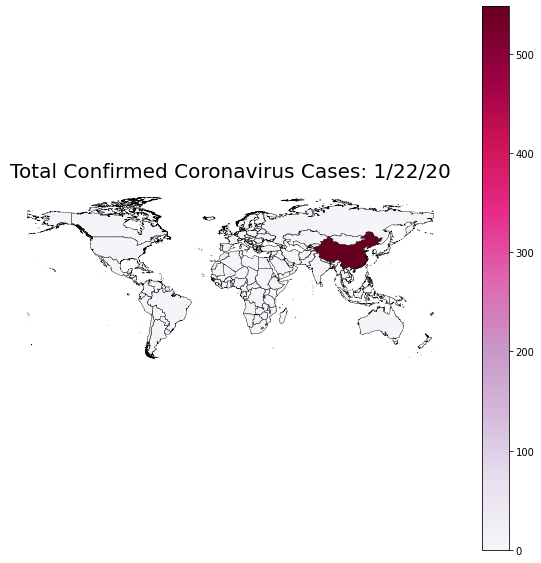

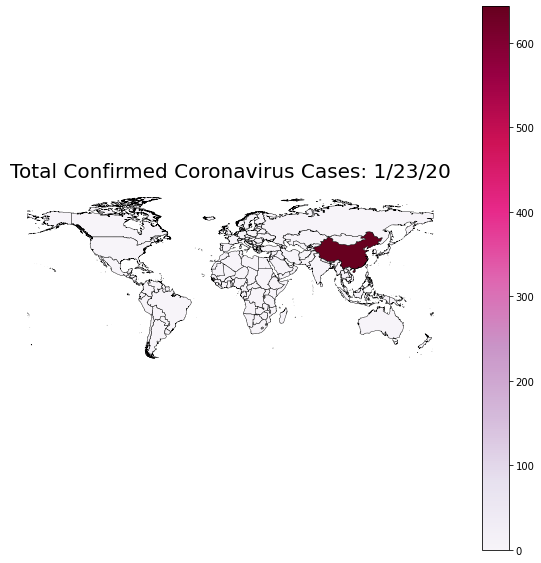

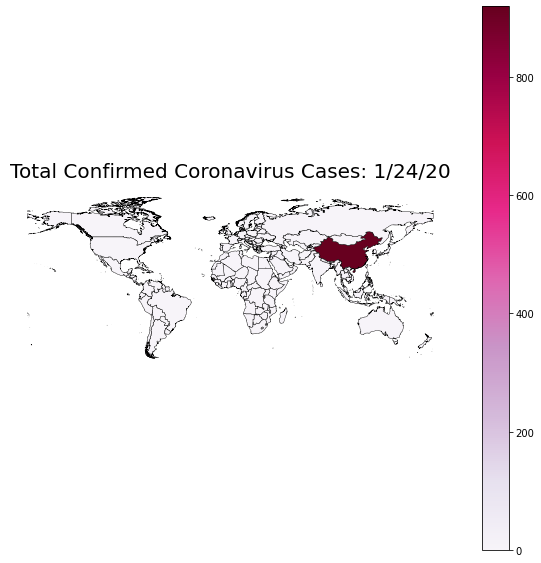

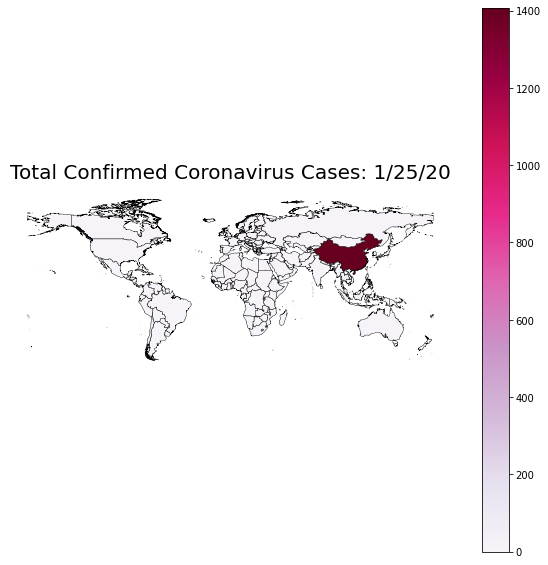

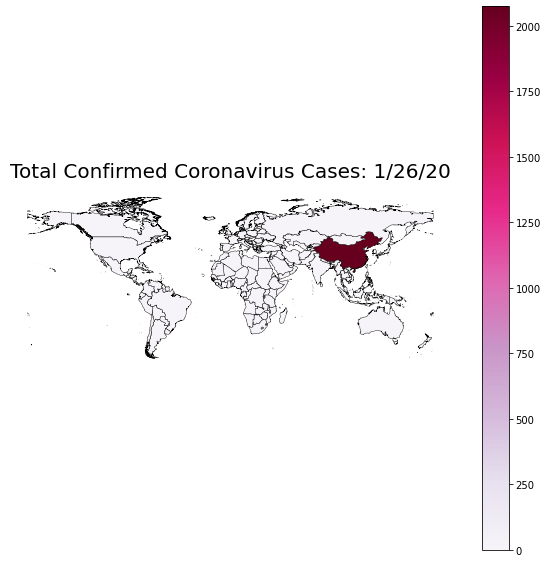

...

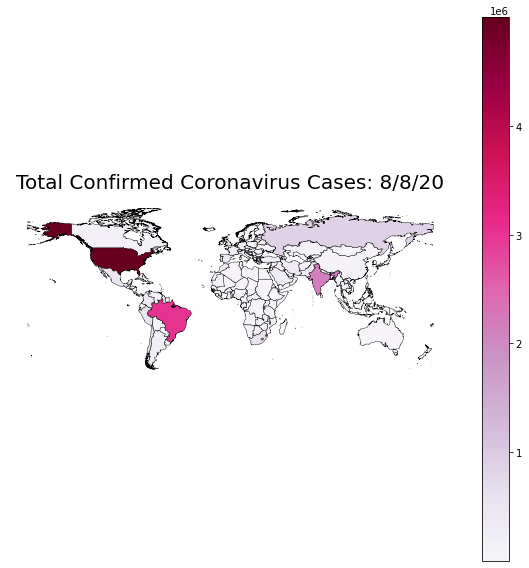

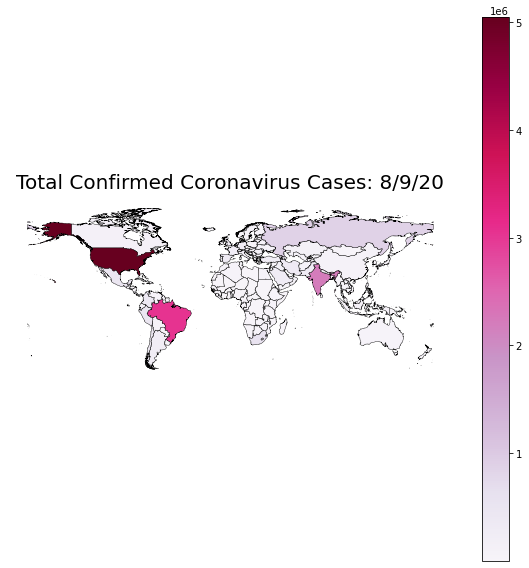

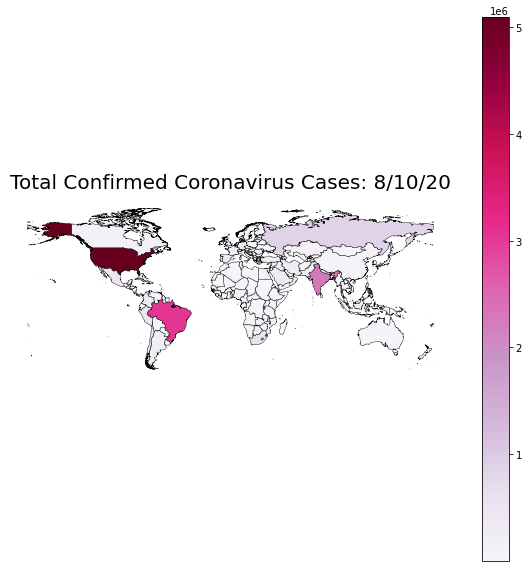

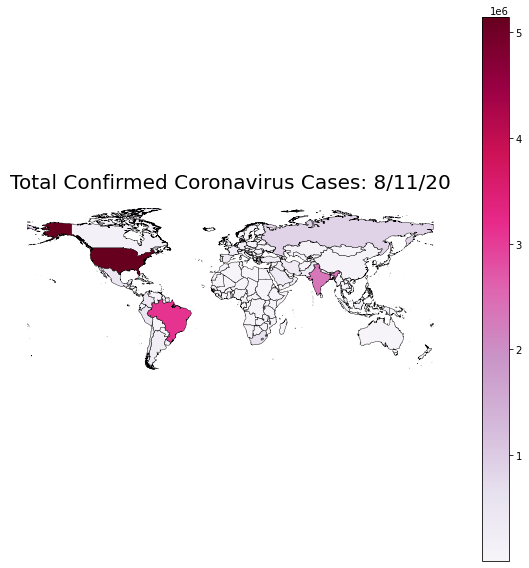

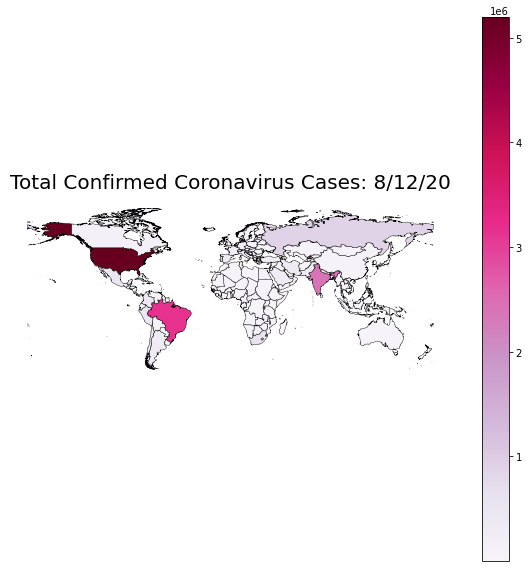

In [23]:
image_frames = []


for dates in merge.columns.to_list()[2:]:

    # Plot

    ax = merge.plot(column=dates,
                    cmap='PuRd',
                    figsize=(10, 10),
                    legend=True,
                    edgecolor='black',
                    linewidth=0.4)
    
    # Add a title to the map
    ax.set_title('Total Confirmed Coronavirus Cases: ' +
                 dates, fontdict={'fontsize': 20}, pad=12.5)

    # Removing the axes

    ax.set_axis_off()


    img = ax.get_figure()

    f = io.BytesIO()

    img.savefig(f, format='png', bbox_inches='tight')
    f.seek(0)

    image_frames.append(PIL.Image.open(f))
    
        

In [24]:
# creatig gif file

image_frames[0].save('globe_covid.gif',
                     save_all=True,
                     append_images=image_frames[1:],
                     optimize=False,
                     duration=150, 
                     loop=1)

f.close()

